In [2]:
#! /usr/bin/env python

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%config InlineBackend.print_figure_kwargs={'dpi' : 90}
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%load_ext autoreload
%autoreload 2

import os
from urllib.request import urlopen
#import reproject
from io import StringIO,BytesIO
from astropy.io import ascii
from astropy.io import fits as pyfits
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.modeling import models, fitting
from astropy.visualization.wcsaxes.frame import EllipticalFrame
from astropy.utils.data import get_pkg_data_filename
from astropy.table import Table,Column, vstack
from astropy.wcs import WCS
import matplotlib.cm as cm
#import astropy_healpix as ahp
#import healpy as hp
import numpy as np
import scipy.interpolate as sinterp
import scipy.integrate as sint
import scipy.optimize as sop
import emcee
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter

mpl.rc('font',**{'family':'serif','serif':['Palatino']})
mpl.rc('axes',facecolor = (1,1,1,1))
mpl.rc('figure',facecolor = 'w')
mpl.rc('text', usetex=True)
mpl.rc('figure',figsize=(4.2,2.4))
mpl.rc('figure',dpi=320)
mpl.rc('savefig',dpi=320)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
#import gammacat
#import ruamel.yaml as yaml
import json
from astropy.io.misc import yaml
from astropy.table import Table
from astropy.io import fits as pyfits

In [5]:
def read_yaml(f):
    with open(f) as temp:
        output = yaml.load(temp.read())
    return(output)

def build_gammacat(ind="/lustre/fs23/group/cta/users/mnievas/Nextcloud/CTA/Catalogs/gamma-cat/output" ,
                   outf="gammacat_export_20210215.yaml"):
    os.chdir(ind)
    #p = pyfits.open("gammacat.fits.gz")
    
    with open("gammacat.yaml") as gammacat:
        temp = yaml.load(gammacat.read())
        gammacat = dict()
        for k,source_id in enumerate(temp):
            gammacat[source_id[0][1]] = dict()
            for pair in temp[k]:
                gammacat[source_id[0][1]][pair[0]] = pair[1]
    
    with open("gammacat-datasets.json") as datasets:
        temp = json.load(datasets)
        datasets = dict()
        for item in temp:
            if item['source_id'] not in datasets:
                datasets[item['source_id']] = dict()
            # copy identifiers from gammacat

            if item['source_id'] in gammacat:
                print('Appending data from gammacat[{0}]'.format(item['source_id']))
                for tocopy in gammacat[item['source_id']]:
                    datasets[item['source_id']][tocopy] = gammacat[item['source_id']][tocopy]
            else:
                print('Fallback, getting the info from the sources dir')
                info = read_yaml("sources/tev-{0:06d}.yaml".format(item['source_id']))
                for tocopy in info:
                    datasets[item['source_id']][tocopy] = info[tocopy]

            if item['type'] == 'sed':
                try:
                    content = open(item['location']).read() #Table.read(item['location'])
                except:
                    print('Skipping {0}'.format(item['location']))

                if 'sed' in datasets[item['source_id']]:
                    datasets[item['source_id']]['sed'].append(content)
                else:
                    datasets[item['source_id']]['sed'] = [content]
                    
                    
    with open("gammacat_export_20210215.yaml","w+") as gcf:
        yaml.dump(datasets,gcf)
        
    return(datasets)

In [8]:
open(item['location']).read()

NameError: name 'item' is not defined

In [37]:
try:
    print('trying to read catalog')
    with open("gammacat_export_20210215.yaml") as gcf:
        datasets = yaml.load(gcf)
except:
    #raise
    print('building catalog')
    datasets = build_gammacat(ind="/lustre/fs23/group/cta/users/mnievas/Nextcloud/CTA/Catalogs/gamma-cat/output" ,
                              outf="gammacat_export_20210215.yaml")

trying to read catalog


In [12]:
fhl3 = pyfits.open("https://fermi.gsfc.nasa.gov/ssc/data/access/lat/3FHL/gll_psch_v13.fit")
#fgl4 = pyfits.open("https://fermi.gsfc.nasa.gov/ssc/data/access/lat/8yr_catalog/gll_psc_v19.fit")
fgl4 = pyfits.open("https://fermi.gsfc.nasa.gov/ssc/data/access/lat/10yr_catalog/gll_psc_v26.fit")
lac4 = pyfits.open("https://fermi.gsfc.nasa.gov/ssc/data/access/lat/4LACDR2/table-4LAC-DR2-h.fits")
lac4_low = pyfits.open("https://fermi.gsfc.nasa.gov/ssc/data/access/lat/4LACDR2/table-4LAC-DR2-l.fits") #/lustre/fs23/group/cta/users/mnievas/Nextcloud/CTA/Catalogs/gamma-cat/output

In [13]:
eblmodel = Table.read("https://raw.githubusercontent.com/me-manu/ebltable/master/ebltable/data/tau_dominguez11_cta.out",format='ascii')
eblstruc = eblmodel.as_array()
eblarray = eblstruc.view(np.float64).reshape(eblstruc.shape + (-1,))
redshifts = eblarray[0][1:]
energies  = np.log10(eblarray[:,0][1:])
tau2d     = eblarray[1:,1:]
z2d,e2d = np.meshgrid(redshifts,energies)

E0 = 0.1 # 100 GeV

In [14]:
class spectra(object):
    def ebl_absorption(self,zz,ee):
        #eblatten = np.exp(-sinterp.griddata((z2d.ravel(),e2d.ravel()),
        #                                tau2d.ravel(),
        #                                (zz,ee),
        #                                method='cubic',
        #                                fill_value=0))
        
        try:
            self.ebl_eval
        except:
            self.ebl_eval = sinterp.RectBivariateSpline(redshifts,energies,tau2d,kx=1,ky=1)
        
        eblatten = self.ebl_eval(zz,ee)
        #eblatten[ee>np.max(energies)] = 0        
        return np.exp(-eblatten[0])

    @classmethod
    def power_law(cls,E, theta):
        N0, Gamma = theta
        dNdE = 10**N0*(E/10**E0)**Gamma
        sed = np.power(E,2)*dNdE
        return(sed)

    @classmethod
    def logparabola(cls,E, theta):
        N0, Gamma, beta = theta
        beta = beta**2
        dNdE = 10**N0*(E/10**E0)**(Gamma-beta*np.log10(E/10**E0))
        sed = np.power(E,2)*dNdE
        return(sed)

    @classmethod
    def pwl_exp_supcutoff(cls,E, theta):
        N0, Gamma1, logEcutoff, Gamma2 = theta
        dNdE = 10**N0*(E/10**E0)**(Gamma1) *np.exp(-(E/10**logEcutoff)**Gamma2)
        sed = np.power(E,2)*dNdE
        return(sed)
    
    @classmethod
    def flexible_model(cls,E,model):
        # Not prepared for fitting.
        # This model, depending on the Beta and ExpI/F can represent a pure powerlaw 
        PivotE = model['PivotE']
        Fnorm  = model['Fnorm']
        EFnorm = model['EFnorm']
        Gamma  = model['Gamma']
        EGamma = model['EGamma']
        if 'Beta' in model:
            Beta  = model['Beta']
            EBeta = model['EBeta']
        else:
            Beta  = 0
            EBeta = 0
        if 'ExpF' in model:
            ExpF  = model['ExpF']
            EExpF = model['EExpF']
            ExpI  = model['ExpI']
            EExpI = model['EExpI']
        else:
            ExpF  = 0
            EExpF = 0
            ExpI  = 0
            EExpI = 0

        #SED = Fnorm * E * E * (E/PivotE)**(-Gamma-Beta*np.log(E/PivotE)) * \
        #    np.exp(-ExpF*(PivotE**ExpI - E**Beta)) * 1.60218*1e-6 #erg/cm2/s

        #logSED = np.log10(Fnorm) + 2*np.log10(E) -\
        #         np.log10(E/PivotE)*(Gamma + Beta*np.log(E/PivotE)) -\
        #         ExpF*(PivotE**ExpI - E**Beta)/np.log(10) +\
        #         np.log10(1.60218*1e-6)
        
        
        sed = (1.60218*1e-6)*Fnorm*(E**2)*\
          ((E/PivotE)**(-Gamma-Beta*np.log(E/PivotE)))*\
          np.exp(ExpF*(PivotE**ExpI - E**ExpI))

        return(sed)
    

def logparabola(E, theta):
    N0, Gamma = theta
    dNdE = 10**N0*(E/0.1)**(Gamma)
    return(dNdE)


In [15]:
class Residues(object):
    def __init__(self):
        # dict with log of values of X and Y-residues for different type of sources.
        self.xlogval = {}
        self.ylogval = {}
        self.ylogmod = {}
        self.ylogres = {}
        self.ylogerr = {}
    
    def add_value(self,point):
        cls     = point['srccls']
        model   = point['model']
        xlogval = point['xlogval']
        ylogval = point['ylogval']
        ylogerr = point['ylogerr']
        ylogmod = point['ylogmod']
        #ylogres = point['ylogres']
        
        if cls not in self.xlogval:
            self.xlogval[cls] = {}
            self.ylogval[cls] = {}
            self.ylogmod[cls] = {}
            self.ylogres[cls] = {}
            self.ylogerr[cls] = {}
        
        if model not in self.xlogval[cls]:
            self.xlogval[cls][model] = []
            self.ylogval[cls][model] = []
            self.ylogmod[cls][model] = []
            self.ylogres[cls][model] = []
            self.ylogerr[cls][model] = []
        
        self.xlogval[cls][model].append(xlogval)
        self.ylogval[cls][model].append(ylogval)
        self.ylogmod[cls][model].append(ylogmod)
        self.ylogres[cls][model].append((ylogval-ylogmod)/ylogerr)
        

In [24]:
class Source(object):
    
    def __init__(self):
        self.xval  = []
        self.xerrn = []
        self.xerrp = []
        self.yval  = []
        self.yerrn = []
        self.yerrp = []
        self.residues = Residues()
        
    def set_residues(self,residues):
        self.residues = residues
        
    @staticmethod
    def match_with_catalog(catalog,src,tol=0.5*u.Unit("deg")):
        coord_catalog = SkyCoord(
            ra=catalog['RAJ2000']*u.Unit("deg"),
            dec=catalog['DEJ2000']*u.Unit("deg"))

        c = SkyCoord(
            ra=src['ra']*u.Unit("deg"),
            dec=src['dec']*u.Unit("deg")
        )
        idx, d2d, d3d = c.match_to_catalog_3d(coord_catalog)
        if (d2d>tol): return(None)
        return(catalog[idx])
    
    def set_ebl_interpolator(self):
        eblmodel = Table.read("https://raw.githubusercontent.com/me-manu/ebltable/master/ebltable/data/tau_dominguez11_cta.out",format='ascii')
        eblstruc = eblmodel.as_array()
        eblarray = eblstruc.view(np.float64).reshape(eblstruc.shape + (-1,))
        redshifts = eblarray[0][1:]
        energies  = np.log10(eblarray[:,0][1:])
        tau2d     = np.transpose(eblarray[1:,1:])
        self.ebl_tau = sinterp.RectBivariateSpline(redshifts,energies,tau2d)
        self.ebl_absorption = lambda z,e: np.exp(-self.ebl_tau(z,np.log10(e)))
    
    def get_fermi_points(self,fermisource,cat='3FHL'):
        if cat=='3FHL':
            raw_energies = fhl3[4].data
        elif cat=='4FGL':
            raw_energies = np.asarray([50,100,300,1e3,3e3,1e4,3e4,3e5])*1e-3
            raw_energies = np.transpose([raw_energies[:-1],raw_energies[1:],0*raw_energies[1:]])

        print(fermisource[0])
            
        fermi_energies =[10**np.mean(np.log10(k[:-1])) for k in raw_energies]
        fermi_energyerrn=np.asarray([fermi_energies[k]-fe[0] for k,fe in enumerate(raw_energies)])
        fermi_energyerrp=np.asarray([fe[1]-fermi_energies[k] for k,fe in enumerate(raw_energies)])
        fermi_fluxes  = fermisource['Flux_Band']*u.Unit("cm**-2 * s**-1")
        fermi_fluxerr = np.transpose(np.abs(fermisource['Unc_Flux_Band']))*u.Unit("cm**-2 * s**-1")
        fermi_energies = fermi_energies*u.Unit("GeV")
        fermi_efluxes  = (fermi_fluxes*fermi_energies).to("erg/(cm2*s)")
        fermi_efluxerr = (fermi_fluxerr*fermi_energies).to("erg/(cm2*s)")

        isnotnan = (~np.isnan(fermi_fluxes))*(~np.isnan(fermi_fluxerr[0]))*(fermi_fluxes>0)

        try:
            self.result
        except:
            self.result = dict()
        
        self.result['name']      = fermisource['Source_Name']
        self.result['energy']    = (fermi_energies[isnotnan]).to("TeV")
        self.result['energyerr'] = (np.asarray([fermi_energyerrn[isnotnan],fermi_energyerrp[isnotnan]])*u.Unit("GeV")).to("TeV")

        self.result['eflux']     = fermi_efluxes[isnotnan]
        self.result['efluxerr']  = np.asarray([fermi_efluxerr[0][isnotnan],
                                          fermi_efluxerr[1][isnotnan]])*u.Unit("erg/(cm2*s)")
        
        '''
        for k,E in enumerate(self.result['energy']):
            self.xval.append(np.log10(self.result['energy'][k].value))
            self.xerrp.append(np.log10(self.result['energy'][k].value+self.result['energyerr'][1][k].value)-self.xval[-1])
            self.xerrn.append(self.xerrp[-1])
            self.yval.append(np.log10(self.result['eflux'][k].value))
            self.yerrp.append(np.log10(self.result['eflux'][k].value+self.result['efluxerr'][1][k].value)-self.yval[-1])
            self.yerrn.append(self.yval[-1]-np.log10(self.result['eflux'][k].value-self.result['efluxerr'][0][k].value))
        '''
        
        # Get parameters + redshift
        self.result['redshift'] = 0
        if cat=='3FHL' and 'REDSHIFT' in fermisource:
            self.result['redshift'] = fermisource['REDSHIFT']
        elif '4FGL' in self.result['name']:
            srcnamefilt = lac4[1].data['Source_Name']==self.result['name']
            if np.sum(srcnamefilt)==1:
                self.redshift = 0 
                if srcnamefilt in lac4[1].data:
                    self.redshift = lac4[1].data[srcnamefilt]['Redshift']
                elif srcnamefilt in lac4_low[1].data:
                    self.redshift = lac4_low[1].data[srcnamefilt]['Redshift']
                if self.redshift >=0:
                    self.result['redshift'] = self.redshift
                    
            self.get_model_parameters(fermisource)
        
        return(self.result)

    def get_model_parameters(self,fermisource):
        # Get model parameters from 4FGL/4LAC:
        self.result['pwl']  = dict()
        self.result['lp']   = dict()
        self.result['plec'] = dict()
        # Powerlaw
        self.result['pwl']['PivotE'] = fermisource['Pivot_Energy']
        self.result['pwl']['Fnorm']  = fermisource['PL_Flux_Density']
        self.result['pwl']['EFnorm'] = fermisource['Unc_PL_Flux_Density'] 
        self.result['pwl']['Gamma']  = fermisource['PL_Index']
        self.result['pwl']['EGamma'] = fermisource['Unc_PL_Index']
        # LogParabola
        self.result['lp']['PivotE'] = fermisource['Pivot_Energy']
        self.result['lp']['Fnorm']  = fermisource['LP_Flux_Density']
        self.result['lp']['EFnorm'] = fermisource['Unc_LP_Flux_Density'] 
        self.result['lp']['Gamma']  = fermisource['LP_Index']
        self.result['lp']['EGamma'] = fermisource['Unc_LP_Index']
        self.result['lp']['Beta']   = fermisource['LP_beta']
        self.result['lp']['EBeta']  = fermisource['Unc_LP_beta']
        # Powerlaw with exponential cutoff
        self.result['plec']['PivotE'] = fermisource['Pivot_Energy']
        self.result['plec']['Fnorm']  = fermisource['PLEC_Flux_Density']
        self.result['plec']['EFnorm'] = fermisource['Unc_PLEC_Flux_Density']
        self.result['plec']['Gamma']  = fermisource['PLEC_Index']
        self.result['plec']['EGamma'] = fermisource['Unc_PLEC_Index']
        self.result['plec']['ExpF']   = fermisource['PLEC_Expfactor']
        self.result['plec']['EExpF']  = fermisource['Unc_PLEC_Expfactor']
        self.result['plec']['ExpI']   = fermisource['PLEC_Exp_Index']
        self.result['plec']['EExpI']  = fermisource['Unc_PLEC_Exp_Index']

    
    def get_vhe_points(self,vhesource):
        results = []
        for k,sed in enumerate(vhesource['sed']):
            energyerr = None
            
            # replace ECSV dump by its Table meaning
            sed = Table.read(sed,format='ascii.ecsv')
            
            
            if 'e_ref' in sed.keys():
                energies = sed['e_ref'].to("TeV")
            if 'dnde' in sed.keys():
                flux = sed['dnde']
            if 'dnde_err' in sed.keys():
                fluxerr = sed['dnde_err']
                fluxerr = [flux-(10**(2*np.log10(flux)-np.log10(flux+fluxerr))),fluxerr]
            if 'dnde_errp' in sed.keys():
                fluxerr = [sed['dnde_errn'],sed['dnde_errp']]            

            isnotnan = ~np.isnan(flux) * (flux>0)
            energies = energies[isnotnan]
            flux     = flux[isnotnan]
            fluxerr  = np.asarray([fluxerr[0][isnotnan],fluxerr[1][isnotnan]])

            if 'e_min' in sed.keys() and 'e_max' in sed.keys():
                energyerrn = (energies-sed['e_min'][isnotnan]).to(energies.unit)
                energyerrp = (sed['e_max'][isnotnan]-energies).to(energies.unit)

            if energyerr is None:
                energylog = np.log10(energies.value)
                energylogsep = np.min(energylog[1:]-energylog[:-1])
                energyerrn = energies.value-(10**(energylog-energylogsep/2.))
                energyerrp = 10**(energylog+energylogsep/2.)-energies.value

            e2flux    = energies**2 *flux
            e2fluxerr = energies**2 *fluxerr

            result = {}
            result['name']      = vhesource['common_name']
            result['energy']    = energies
            result['energyerr'] = np.asarray([energyerrn,energyerrp])*energies.unit
            result['eflux']     = e2flux
            result['efluxerr']  = e2fluxerr
            results.append(result)
            
            '''
            for k,E in enumerate(result['energy']):
                self.xval.append(np.log10(result['energy'][k].value))
                self.xerrp.append(np.log10(result['energy'][k].value+result['energyerr'][1][k].value)-self.xval[-1])
                self.xerrn.append(self.xerrp[-1])
                self.yval.append(np.log10(result['eflux'][k].value))
                self.yerrp.append(np.log10(result['eflux'][k].value+result['efluxerr'][1][k].value)-self.yval[-1])
                self.yerrn.append(self.yval[-1]-np.log10(result['eflux'][k].value-result['efluxerr'][0][k].value))
            '''
        return(results)
    
    def broadband_sed(self,dataset,model='pwl'):
        redshift = None
        ### extract the sed    
        if 'sed' not in dataset.keys():
            print('no sed')
            return(None)
        
        self.spectra = spectra()
        
        self.fig = plt.figure(figsize=(6,3))
        #sedplot = fig.add_subplot(111)
        sedplot = self.fig.add_axes((.1,.3,.8,.6))
        resplot = self.fig.add_axes((.1,.1,.8,.2))

        self.list_of_spectra = dict()
        self.list_of_spectra['xlog']    = []
        self.list_of_spectra['ylog']    = []
        self.list_of_spectra['yerrlog'] = []

        vhe_array   = self.get_vhe_points(dataset)

        ### Match with 4FGL
        matched = self.match_with_catalog(fgl4[1].data,dataset)
        if matched is not None:
            fermi = self.get_fermi_points(matched,'4FGL')
            #print(fermi)
            gammamodel = dict(fermi) # make a copy to preserve the 4FGL spectral model.
            if (redshift==None): redshift = fermi['redshift']
            for j in range(len(fermi['energy'].value)):
                self.list_of_spectra['xlog'].append(fermi['energy'][j].value)
                self.list_of_spectra['ylog'].append(fermi['eflux'][j].value)
                self.list_of_spectra['yerrlog'].append(fermi['efluxerr'][1][j].value)

            sedplot.errorbar(x=fermi['energy'].value,
                             xerr=fermi['energyerr'].value,
                             y=fermi['eflux'].value,
                             yerr=fermi['efluxerr'].value,
                             ls='',marker='o',color='gray',ms=4,mfc='white',
                             label='{0} (4FGL)'.format(fermi['name']))
            
            
            xfit = fermi['energy'].value
            fitatten = self.ebl_absorption(redshift,xfit)[0]
            reasonable = fitatten>1e-3
            xfit = xfit[reasonable]
            fitatten = fitatten[reasonable]
            yfit = self.spectra.flexible_model(xfit*1e6,gammamodel[model])*fitatten
            res    = (fermi['eflux'].value[reasonable]-yfit)/yfit
            reserr = fermi['efluxerr'][1].value[reasonable]/yfit
            resplot.errorbar(x=xfit, 
                             y=res, 
                             yerr=reserr,
                             ls='',marker='o',color='gray',ms=4,mfc='white')
            
            
        else:
            print('no match in 4FGL')
        
        
        ### Match with 3FHL
        matched = self.match_with_catalog(fhl3[1].data,dataset)
        if matched is not None:
            fermi = self.get_fermi_points(matched, '3FHL')
            if (redshift==None): redshift = fermi['redshift']
            
            for j in range(len(fermi['energy'].value)):
                self.list_of_spectra['xlog'].append(fermi['energy'][j].value)
                self.list_of_spectra['ylog'].append(fermi['eflux'][j].value)
                self.list_of_spectra['yerrlog'].append(fermi['efluxerr'][1][j].value)

            sedplot.errorbar(x=fermi['energy'].value,
                             xerr=fermi['energyerr'].value,
                             y=fermi['eflux'].value,
                             yerr=fermi['efluxerr'].value,
                             ls='',marker='o',color='black',ms=4,mfc='white',
                             label='{0} (3FHL)'.format(fermi['name']))
            
            xfit = fermi['energy'].value
            fitatten = self.ebl_absorption(redshift,xfit)[0]
            reasonable = fitatten>1e-3
            xfit = xfit[reasonable]
            fitatten = fitatten[reasonable]
            yfit = self.spectra.flexible_model(xfit*1e6,gammamodel[model])*fitatten
            res    = (fermi['eflux'].value[reasonable]-yfit)/yfit
            reserr = fermi['efluxerr'][1].value[reasonable]/yfit
            resplot.errorbar(x=xfit, 
                             y=res, 
                             yerr=reserr,
                             ls='',marker='o',color='black',ms=4,mfc='white')
            
        else:
            print('no match in 3FHL')

        # Fit to a log-parabola to check which is the lowest state
        logLP = lambda x,*par: np.log10(x*x*logparabola(x,par))
        FlLogabove100_array = []
        
        for k,vhe in enumerate(vhe_array):
            logLPabs = lambda x,*args: logLP(10**x,*args) + np.log10(self.ebl_absorption(redshift,10**x)[0])
            p0f=[-11.,-2.]
            
            _xfit = np.log10(vhe['energy'].value)
            _yfit = np.log10(vhe['eflux'].value)
            _yerr = np.ones(_yfit.shape)*1e-13 # np.log10(vhe['eflux'].value+vhe['efluxerr'][1].value)-_yfit
            
            popt,pcov = sop.curve_fit(logLPabs, _xfit, _yfit,
                                        p0f,
                                        sigma=_yerr)
                                      
            logLPfit      = lambda x: logparabola(10**x,popt)
            FlLogabove100 = sint.quad(logLPfit,-0.5,0.8)
            FlLogabove100_array.append(FlLogabove100[0])
            vhe['k'] = k
            
        print(FlLogabove100_array)
        k_lowstate = np.argmin(FlLogabove100_array)
        k_higstate = np.argmax(FlLogabove100_array)
        
        for k,vhe in enumerate(vhe_array):
            # plot every vhe spectrum / dataset
            for j in range(len(vhe['energy'].value)):
                self.list_of_spectra['xlog'].append(vhe['energy'][j].value)
                self.list_of_spectra['ylog'].append(vhe['eflux'][j].value)
                self.list_of_spectra['yerrlog'].append(vhe['efluxerr'][1][j].value)

            sedplot.errorbar(x=vhe['energy'].value,
                             xerr=vhe['energyerr'].value,
                             y=vhe['eflux'].value,
                             yerr=vhe['efluxerr'].value,
                             ls='',marker='D',ms=4,mfc='white' if vhe['k']!=k_lowstate else 'black',
                             label='{0}, {1} (VHE)'.format(vhe['name'],k+1))
            
            
            if vhe['k']==k_lowstate:
                for ki,E in enumerate(vhe['energy']):
                    self.xval.append(np.log10(vhe['energy'][ki].value))
                    self.xerrp.append(np.log10(vhe['energy'][ki].value+vhe['energyerr'][1][ki].value)-self.xval[-1])
                    self.xerrn.append(self.xerrp[-1])
                    self.yval.append(np.log10(vhe['eflux'][ki].value))
                    self.yerrp.append(np.log10(vhe['eflux'][ki].value+vhe['efluxerr'][1][ki].value)-self.yval[-1])
                    self.yerrn.append(self.yval[-1]-np.log10(vhe['eflux'][ki].value-vhe['efluxerr'][0][ki].value))
            
            xfit = vhe['energy'].value
            fitatten = self.ebl_absorption(redshift,xfit)[0]
            reasonable = fitatten>1e-3
            xfit = xfit[reasonable]
            fitatten = fitatten[reasonable]
            yfit = self.spectra.flexible_model(xfit*1e6,gammamodel[model])*fitatten
            res    = (vhe['eflux'].value[reasonable]-yfit)/yfit
            reserr = vhe['efluxerr'][1].value[reasonable]/yfit
            resplot.errorbar(x=xfit, 
                             y=res, 
                             yerr=reserr,
                             ls='',marker='D',ms=4,mfc='white')
            
        
        for model in [ "pwl", "lp", "plec" ]:
            #print(fermi[model])
            xfit = 10**np.linspace(-4,2,500) # TeV
            fitatten = self.ebl_absorption(redshift,xfit)[0]
            xfit = xfit[fitatten>1e-3]
            fitatten = fitatten[fitatten>1e-3]
            yfit = self.spectra.flexible_model(xfit*1e6,gammamodel[model])*fitatten
            sedplot.plot(xfit, yfit,label=model)
            
            for k,xval in enumerate(self.xval):
                fitatten_p = self.ebl_absorption(redshift,10**xval).flatten()
                ymodel_p = (self.spectra.flexible_model((10**xval)*1e6,gammamodel[model])*fitatten_p)[0]
                point = {
                    'srccls': dataset['classes'],
                    'model': model,
                    'xlogval': self.xval[k],
                    'ylogval': self.yval[k],
                    'ylogerr': self.yerrp[k] if self.yval[k]<ymodel_p else self.yerrm[k],
                    'ylogmod': np.log10(ymodel_p),
                }
                self.residues.add_value(point)
        
        #box = sedplot.get_position()
        #sedplot.set_position([box.x0, box.y0, 
        #                      box.width * 0.8, box.height])

        sedplot.set_xlim(45*1e-6,100)
        resplot.set_xlim(45*1e-6,100)
        sedplot.set_yscale('log')
        sedplot.set_xscale('log')
        sedplot.set_ylim([1e-15,1e-10])
        sedplot.axes.get_xaxis().set_visible(False)
        #resplot.set_yscale('log')
        resplot.set_xscale('log')
        sedplot.set_ylabel('$\mathrm{SED}\ [erg\ cm^{-2} s^{-1}]$')
        sedplot.set_xlabel('$\log_{10}(\mathrm{Energy})\ [TeV]$')
        sedplot.legend(fontsize='xx-small',
                       loc='center left', 
                       bbox_to_anchor=(1, 0.5))
        
        plt.tight_layout()
        plt.savefig("FermiAndVHE{0}.png".format(vhe['name'].replace(" ","")),
                    dpi=200,bbox_inches='tight')
        
        return(self.fig)

In [25]:
Res  = Residues()
Test = Source()
Test.set_residues(Res)
Test.set_ebl_interpolator()

4FGL J0013.9-1854
3FHL J0013.8-1855
[8.28817234579311e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:328: RuntimeWarning: invalid value encountered in log10
  self.yerrn.append(self.yval[-1]-np.log10(vhe['eflux'][ki].value-vhe['efluxerr'][0][ki].value))
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt

4FGL J0152.6+0147
3FHL J0152.6+0147
[2.527089108505398e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0222.6+4302
3FHL J0222.6+4302
[3.0875650377217675e-12, 5.861165331958786e-12, 3.712027527776866e-12, 2.346862282358002e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0232.8+2018
3FHL J0232.8+2017
[2.4129345020338817e-12, 1.816321532707378e-12, 3.4058106766650362e-12, 1.3633266760146052e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0303.4-2407
3FHL J0303.4-2407
[6.808883015577367e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0319.8+1845
3FHL J0319.8+1845
[1.6216108173173507e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0349.4-1159
3FHL J0349.3-1159
[2.0877073010098606e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0416.9+0105
3FHL J0416.8+0105
[6.799177871649719e-13, 1.6148133973974915e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0449.4-4350
3FHL J0449.4-4350
[3.147539182746124e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0521.7+2112
3FHL J0521.7+2112
[5.8302698882381055e-12]


<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0648.7+1516
3FHL J0648.7+1517
[1.9491208068827446e-12]


<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0710.4+5908
3FHL J0710.4+5908
[3.149218928990712e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0721.9+7120
3FHL J0721.8+7120
[1.4292490651017122e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J0809.8+5218
3FHL J0809.8+5218
[1.9555463186371684e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1010.2-3119
3FHL J1010.2-3119
[9.230109587191376e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1015.0+4926
3FHL J1015.0+4926
[4.682648807578112e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1103.6-2329
3FHL J1103.6-2328
[2.199230676912206e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1104.4+3812
3FHL J1104.4+3812
[9.116833419498538e-11, 2.757212070617136e-10, 6.819347775590211e-10, 1.1394772410823549e-09, 1.9246806762682666e-09, 5.848329710891315e-11, 4.119403170905768e-10, 8.855821828368473e-11, 5.821176958389915e-11, 1.4365359411956504e-10, 8.15645335866225e-11, 7.137557957970133e-11, 2.115582763568212e-10, 7.79601702391647e-11, 6.679614203725448e-11, 4.985776908010325e-10, 8.0361374861383e-11, 1.5208644911669308e-10, 1.8628873473158613e-10, 7.491535366499716e-11, 3.3520503666404356e-10, 7.298179404834469e-10, 8.298388772862264e-10, 2.0602756203104648e-10, 2.7900712966704785e-10, 1.0742214337739636e-09, 1.0014777757400433e-10, 4.6819638115380384e-11, 1.9609480172018427e-10, 2.2276896975416963e-11, 3.853760548202853e-11, 1.374804329405274e-11, 1.374804329405274e-11, 1.6808352282837465e-10, 1.4631096508796633e-10]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1136.4+7009
3FHL J1136.5+7009
[5.211362696995965e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1217.9+3007
3FHL J1217.9+3006
[3.0505439360960413e-12, 2.2505431351783823e-12, 1.6831922460945862e-10]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-24-75a445dd1987>:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are

4FGL J1221.5+2814
3FHL J1221.5+2813
[6.17062949080794e-12, 1.9326618814040143e-11]
4FGL J1221.3+3010
3FHL J1221.3+3010
[5.1272004516258934e-12, 6.905522711385977e-12, 9.112199639691276e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1224.9+2122
3FHL J1224.9+2122
[1.4224030147766165e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1230.8+1223
3FHL J1230.8+1223
[1.9316765453019568e-12, 1.6409843078653943e-12, 4.727624923193956e-12, 1.752381357927551e-12, 6.228258023973811e-12, 1.2211089696945491e-11, 3.777485256141184e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1256.1-0547
3FHL J1256.1-0547
[1.0242605979119149e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1315.0-4236
3FHL J1315.0-4237
[8.032193219854131e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1427.0+2348
3FHL J1427.0+2348
[1.105098799682399e-12, 1.6751481599877038e-12, 1.1769789890544706e-12, 1.9157102198320844e-12, 8.540733805882285e-13, 7.883394444639797e-13, 3.9088757594428087e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1428.5+4240
3FHL J1428.5+4240
[2.743880057787064e-11, 1.524271374589395e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1442.7+1200
3FHL J1442.8+1200
[6.20882044169593e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1512.8-0906
3FHL J1512.8-0906
[7.485229106096702e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1517.7-2422
3FHL J1517.6-2422
[1.7091459692588602e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1555.7+1111
3FHL J1555.7+1111
[3.101556388654427e-12, 1.6606791329017382e-12, 3.5944697383722304e-12, 3.1321565740321832e-12, 3.1321565740321832e-12, 1.4523876309747975e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1653.8+3945
3FHL J1653.8+3945
[2.5780458626024293e-09, 6.57780397543479e-11, 1.4614070387143238e-11, 3.443129397110335e-11, 1.3985663459191018e-10, 1.3985663459191018e-10, 3.868556799462114e-11, 1.0135884256869977e-10, 1.2654565312028335e-11, 1.4659805524680874e-11, 1.9993237587009615e-11, 5.0089147180815924e-12, 2.172369356077163e-11, 2.172369356077163e-11, 2.172369356077163e-11, 1.1473241342185541e-10, 2.852596905228208e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1728.3+5013
3FHL J1728.3+5013
[7.036167390272668e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1744.0+1935
3FHL J1744.0+1935
[1.3368401527332518e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J1944.0+2117
3FHL J1943.9+2117
[3.0085693282787452e-12]


<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2000.0+6508
3FHL J1959.9+6508
[3.8276285137446906e-10, 4.385377907919117e-10, 9.268237984730577e-12, 2.0198598498249677e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2009.4-4849
3FHL J2009.4-4849
[3.5390534999965923e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2158.8-3013
3FHL J2158.8-3013
[6.029613226812746e-11, 3.1891401412161035e-11, 1.9595468498005212e-11, 1.0304562748209937e-11, 1.1208822180925924e-11, 1.5482214983952687e-11, 1.8275213637534093e-11, 1.9300670459906976e-11, 1.3281266774076954e-11, 9.155425279308376e-11, 6.11140433232815e-11, 1.0711478305675755e-10, 3.144763537245433e-10]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2202.7+4216
3FHL J2202.7+4216
[1.9930568820373948e-12, 5.448099332376559e-11, 5.448099332376559e-11]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2250.0+3825
3FHL J2250.0+3825
[1.5896654032241402e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2347.0+5141
3FHL J2347.0+5142
[1.593053519777732e-10, 6.85001261918608e-12, 1.3762669363213104e-11, 5.0523832548010683e-11, 2.23929779614054e-12, 6.4229856903277095e-12]


<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


4FGL J2359.0-3038
3FHL J2359.1-3038
[1.9674015047840677e-12, 1.354261363421861e-12, 1.2180640580012303e-12]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:328: RuntimeWarning: invalid value encountered in log10
  self.yerrn.append(self.yval[-1]-np.log10(vhe['eflux'][ki].value-vhe['efluxerr'][0][ki].value))
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt

4FGL J1443.9+2501
3FHL J1443.9+2502
[2.3971217335792995e-13]


<ipython-input-24-75a445dd1987>:90: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  if srcnamefilt in lac4[1].data:
<ipython-input-24-75a445dd1987>:92: FutureWarning: elementwise == comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.
  elif srcnamefilt in lac4_low[1].data:
<ipython-input-24-75a445dd1987>:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if cat=='3FHL' and 'REDSHIFT' in fermisource:
<ipython-input-24-75a445dd1987>:384: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


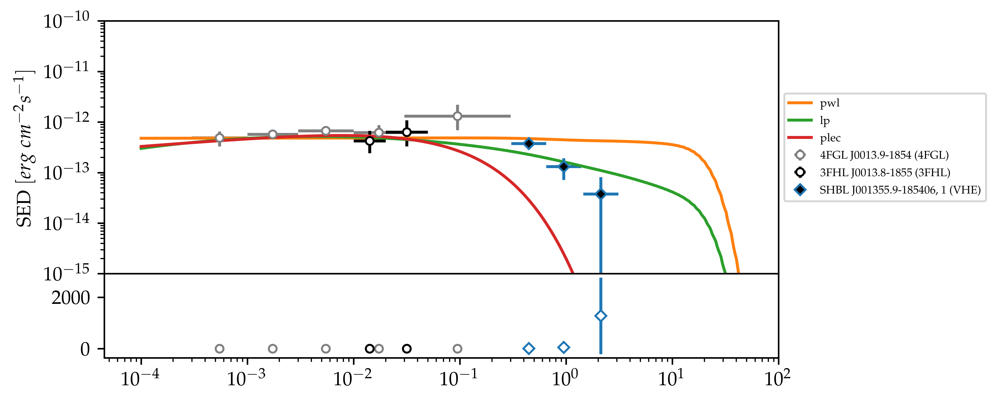

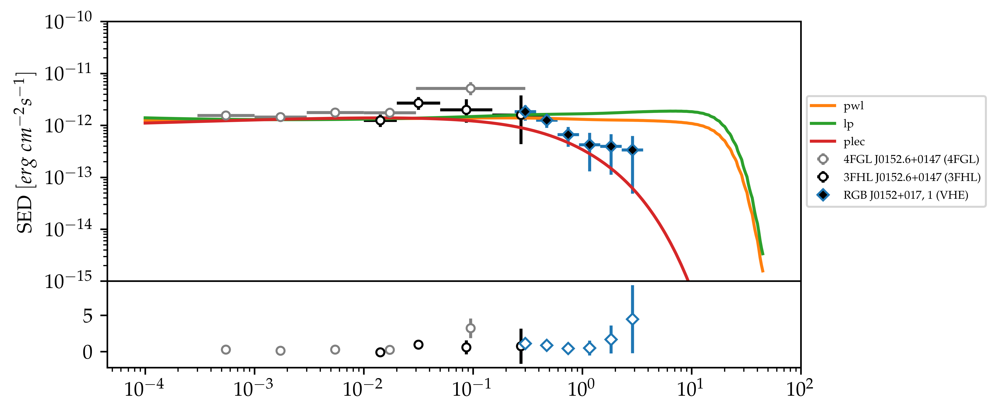

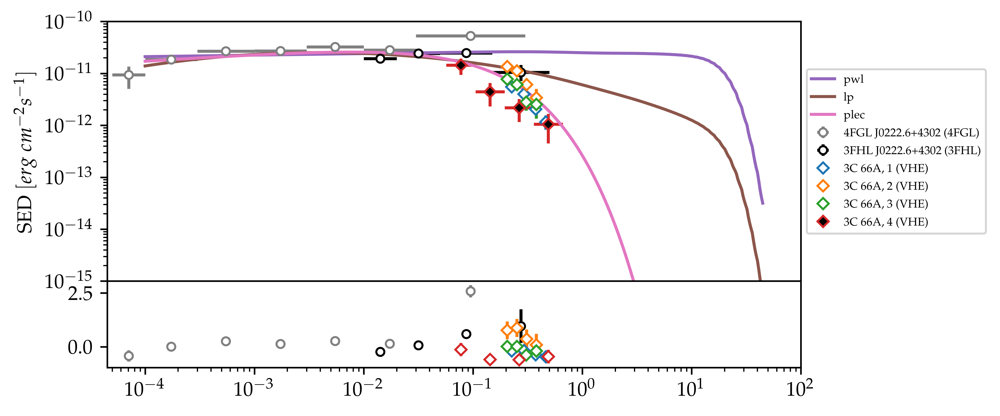

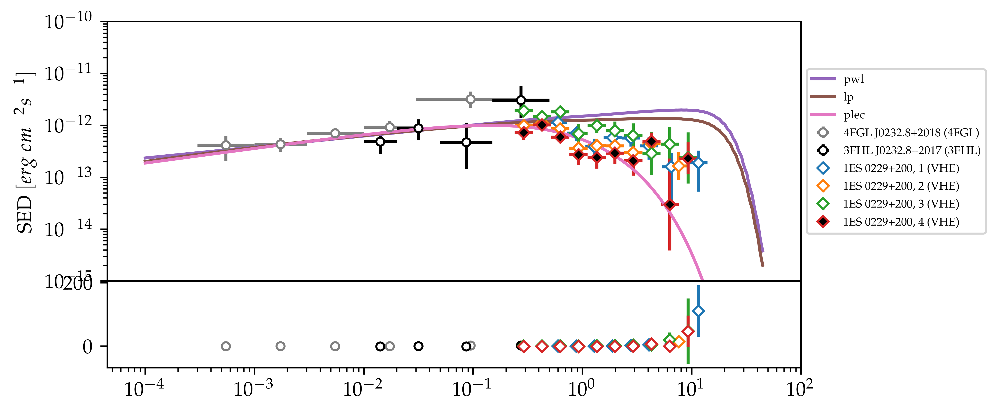

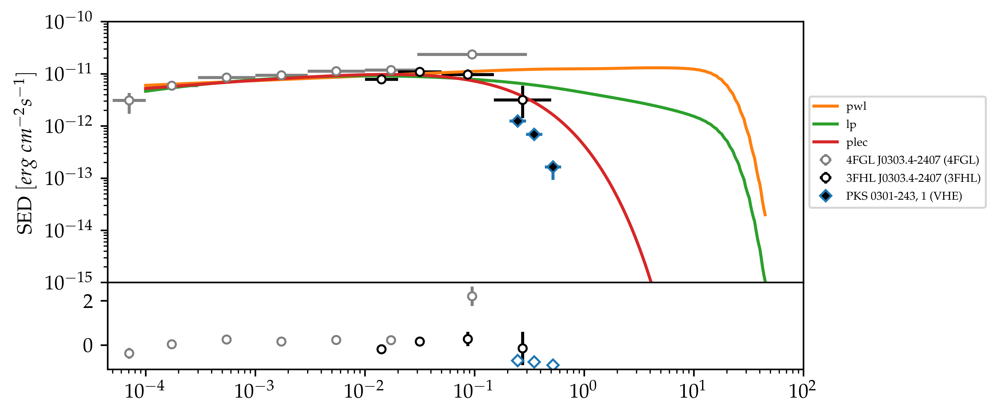

...

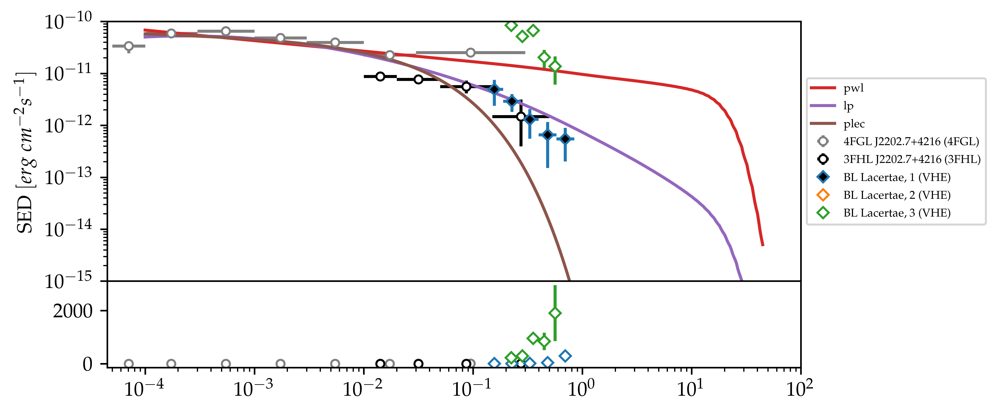

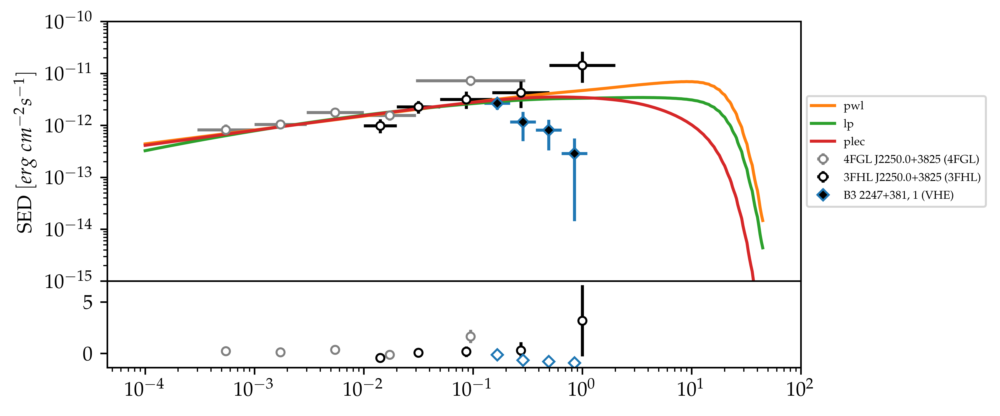

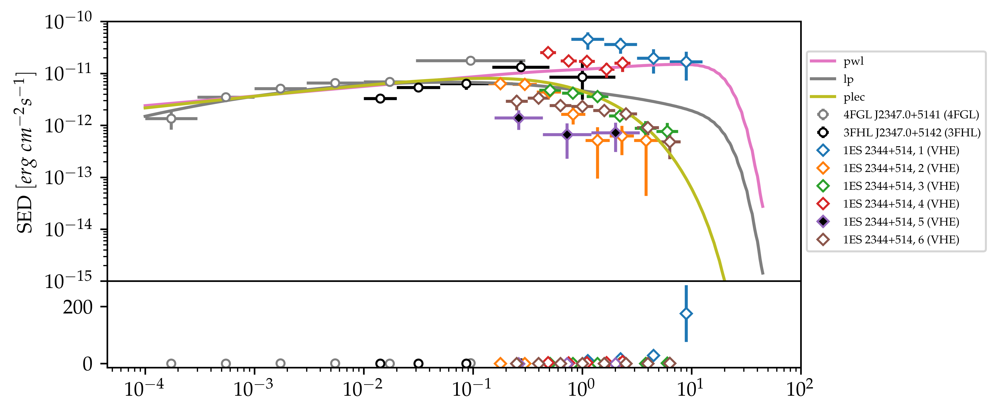

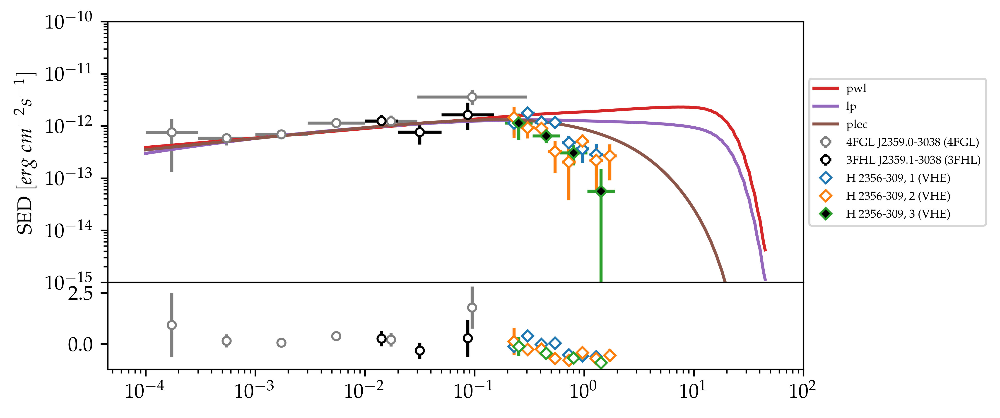

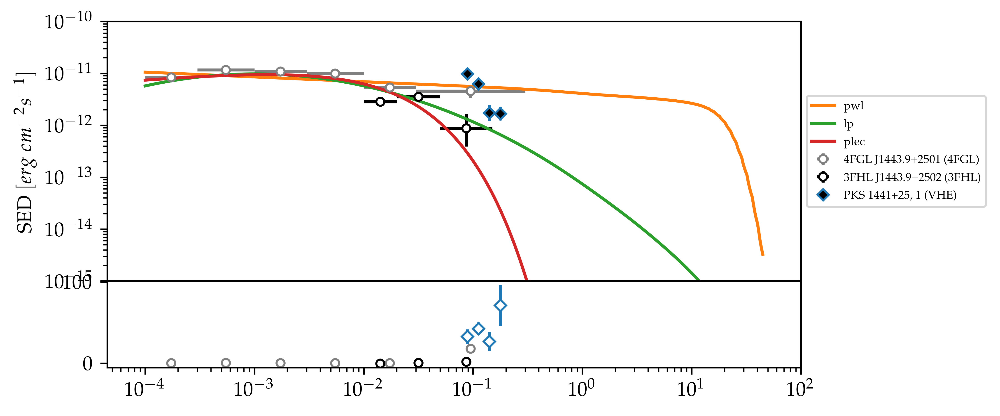

In [53]:
for k,src in enumerate(datasets):
    #if 'PKS 1424+240' not  in datasets[src]['common_name']: continue
    
    if datasets[src]['classes'] not in ['fsrq','hbl','ibl','lbl','fri']:
        continue
    
    ### extract the sed    
    if 'sed' not in datasets[src].keys():
        print('no sed')
        continue
    
    dataset=datasets[src]
    Test.broadband_sed(dataset=dataset,model='plec')
    #if k>10:
    #    break
    #if k>10:
    #    break
#     break

Text(0.5, 0, 'log E [TeV]')

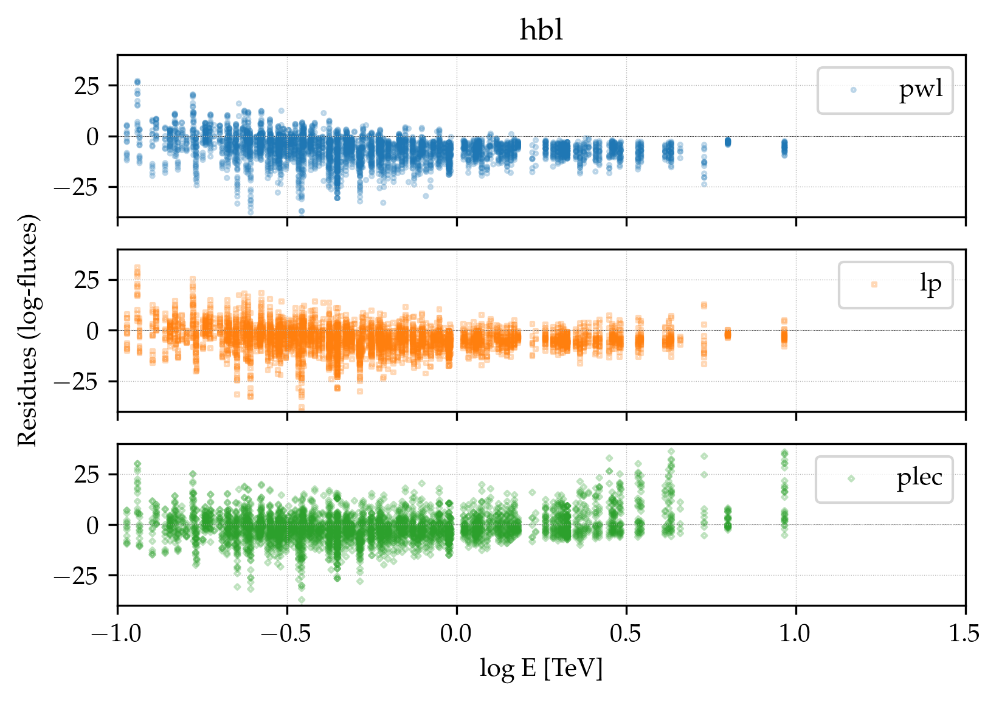

In [54]:
fig,spls = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, 
                        squeeze=True, subplot_kw=None, gridspec_kw=None, figsize=(6,4), dpi=150)

cls='hbl'
for k,mod in enumerate(Test.residues.xlogval[cls]):
    spls[k].scatter(
        Test.residues.xlogval[cls][mod],
        Test.residues.ylogres[cls][mod],
        label=mod,
        s=2,
        marker=['o','s','D'][k],
        facecolor='None',
        color='C{}'.format(k),
        alpha=0.3,
    )
    
    spls[k].axhline(0,lw=0.2,ls='dashed',color='black',zorder=-10)
    spls[k].set_xlim([-1,1.5])
    spls[k].set_ylim([-40,40])
    spls[k].legend()
    spls[k].grid(ls='dotted',lw=0.33)

spls[0].set_title(cls)
spls[1].set_ylabel('Residues (log-fluxes)')
spls[-1].set_xlabel('log E [TeV]')

Text(0.5, 0, 'log E [TeV]')

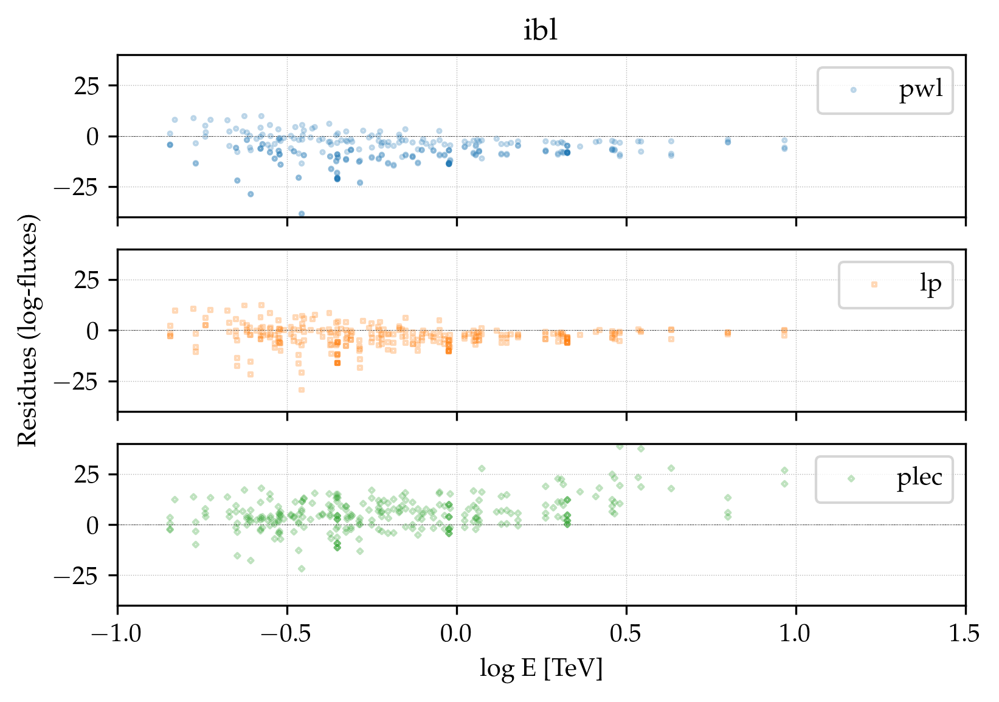

In [55]:
fig,spls = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, 
                        squeeze=True, subplot_kw=None, gridspec_kw=None, figsize=(6,4), dpi=150)

cls='ibl'
for k,mod in enumerate(Test.residues.xlogval[cls]):
    spls[k].scatter(
        Test.residues.xlogval[cls][mod],
        Test.residues.ylogres[cls][mod],
        label=mod,
        s=2,
        marker=['o','s','D'][k],
        facecolor='None',
        color='C{}'.format(k),
        alpha=0.3,
    )
    
    spls[k].axhline(0,lw=0.2,ls='dashed',color='black',zorder=-10)
    spls[k].set_xlim([-1,1.5])
    spls[k].set_ylim([-40,40])
    spls[k].legend()
    spls[k].grid(ls='dotted',lw=0.33)

spls[0].set_title(cls)
spls[1].set_ylabel('Residues (log-fluxes)')
spls[-1].set_xlabel('log E [TeV]')

Text(0.5, 0, 'log E [TeV]')

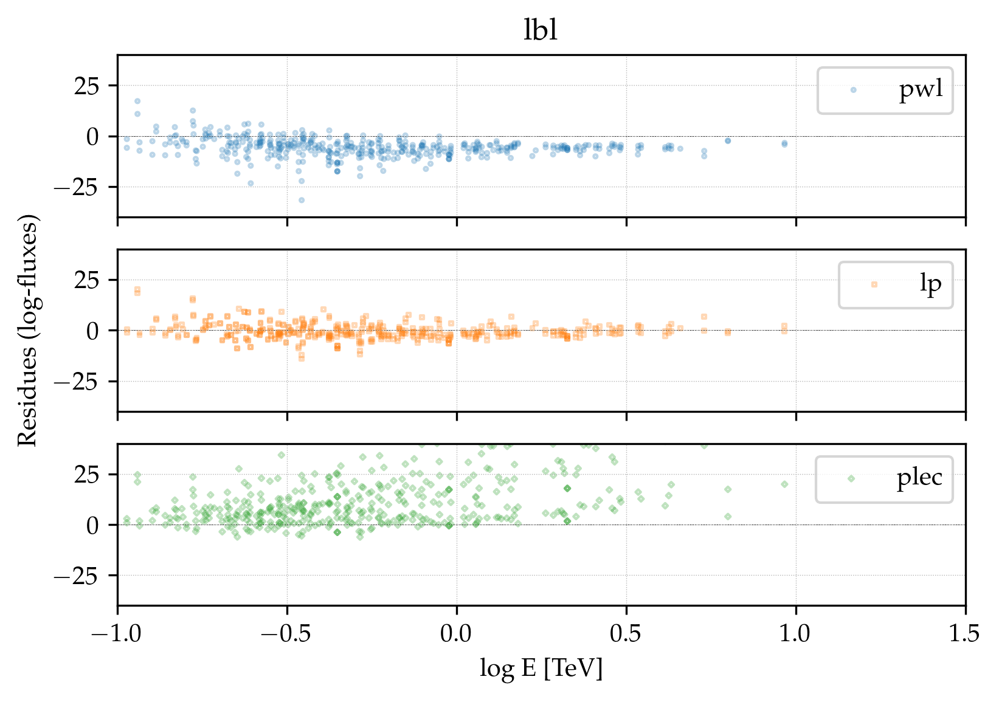

In [56]:
fig,spls = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, 
                        squeeze=True, subplot_kw=None, gridspec_kw=None, figsize=(6,4), dpi=150)

cls='lbl'
for k,mod in enumerate(Test.residues.xlogval[cls]):
    spls[k].scatter(
        Test.residues.xlogval[cls][mod],
        Test.residues.ylogres[cls][mod],
        label=mod,
        s=2,
        marker=['o','s','D'][k],
        facecolor='None',
        color='C{}'.format(k),
        alpha=0.3,
    )
    
    spls[k].axhline(0,lw=0.2,ls='dashed',color='black',zorder=-10)
    spls[k].set_xlim([-1,1.5])
    spls[k].set_ylim([-40,40])
    spls[k].legend()
    spls[k].grid(ls='dotted',lw=0.33)

spls[0].set_title(cls)
spls[1].set_ylabel('Residues (log-fluxes)')
spls[-1].set_xlabel('log E [TeV]')

Text(0.5, 0, 'log E [TeV]')

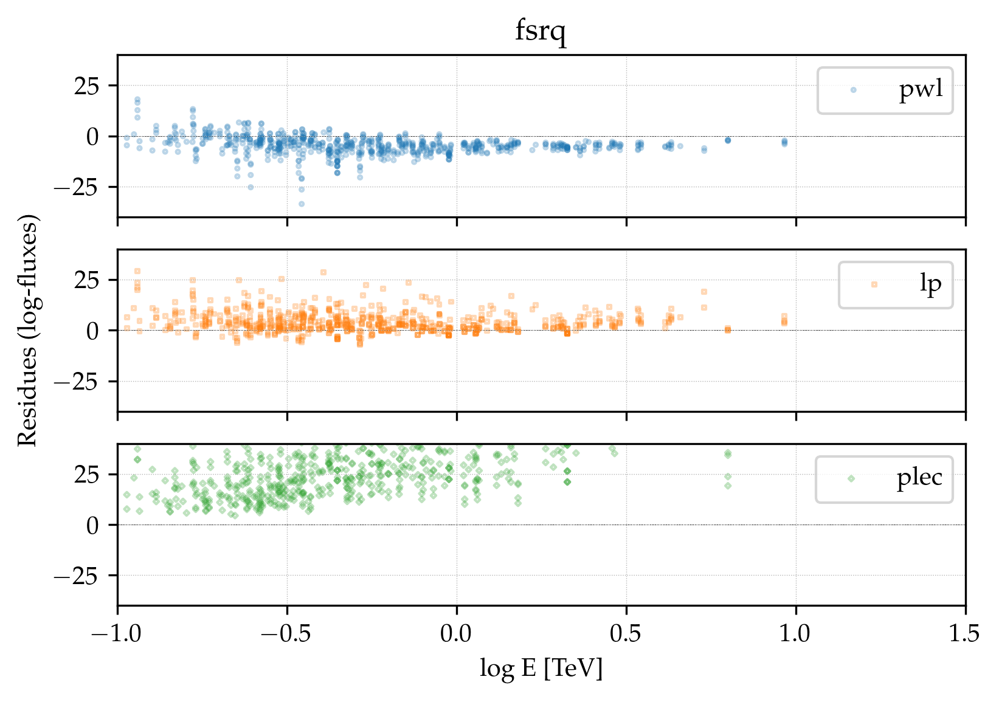

In [57]:
fig,spls = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, 
                        squeeze=True, subplot_kw=None, gridspec_kw=None, figsize=(6,4), dpi=150)

cls='fsrq'
for k,mod in enumerate(Test.residues.xlogval[cls]):
    spls[k].scatter(
        Test.residues.xlogval[cls][mod],
        Test.residues.ylogres[cls][mod],
        label=mod,
        s=2,
        marker=['o','s','D'][k],
        facecolor='None',
        color='C{}'.format(k),
        alpha=0.3,
    )
    
    spls[k].axhline(0,lw=0.2,ls='dashed',color='black',zorder=-10)
    spls[k].set_xlim([-1,1.5])
    spls[k].set_ylim([-40,40])
    spls[k].legend()
    spls[k].grid(ls='dotted',lw=0.33)

spls[0].set_title(cls)
spls[1].set_ylabel('Residues (log-fluxes)')
spls[-1].set_xlabel('log E [TeV]')

In [510]:
Test.residues.xlogval.keys()

dict_keys(['hbl', 'ibl', 'fsrq', 'fri', 'lbl'])

In [511]:
dataset

{'source_id': 167,
 'common_name': 'PKS 1441+25',
 'gamma_names': 'VER J1443+250',
 'fermi_names': '3FGL J1443.9+2502',
 'other_names': '',
 'where': 'egal',
 'classes': 'fsrq',
 'discoverer': 'magic',
 'seen_by': 'magic,veritas',
 'discovery_date': '2015-03',
 'tevcat_id': 263,
 'tevcat2_id': 'IqGXlk',
 'tevcat_name': 'TeV J1443+250',
 'tgevcat_id': -9223372036854775808,
 'tgevcat_name': '',
 'reference_id': '2015ApJ...815L..22A',
 'significance': 7.0,
 'livetime': 15.0,
 'ra': 220.98704528808594,
 'dec': 25.029024124145508,
 'glon': 34.5630989074707,
 'glat': 64.70121765136719,
 'pos_ra': nan,
 'pos_dec': nan,
 'pos_glon': nan,
 'pos_glat': nan,
 'pos_err': nan,
 'morph_type': 'point',
 'morph_sigma': nan,
 'morph_sigma_err': nan,
 'morph_sigma2': nan,
 'morph_sigma2_err': nan,
 'morph_pa': nan,
 'morph_pa_err': nan,
 'morph_pa_frame': '',
 'spec_type': 'pl2',
 'spec_pl_norm': nan,
 'spec_pl_norm_err': nan,
 'spec_pl_norm_err_sys': nan,
 'spec_pl_index': nan,
 'spec_pl_index_err': na

In [1387]:
def log_likelihood(f, theta, x, y, yerr):
    # Operate in y-x-logspace (sampling is more homogeneous)
    # log_f is just to assume we are not estimating correctly 
    # the variance (noisy data)    
    theta,log_f = theta[:-1],theta[-1]
    model = np.log10(f(10**x, theta))
    sigma2 = yerr**2 + model**2*np.exp(2*log_f)
    # assume gaussian errors
    loglike = -0.5*np.sum((y-model)**2/sigma2 + np.log(sigma2))
    return loglike

NameError: name 'get_vhe_points' is not defined

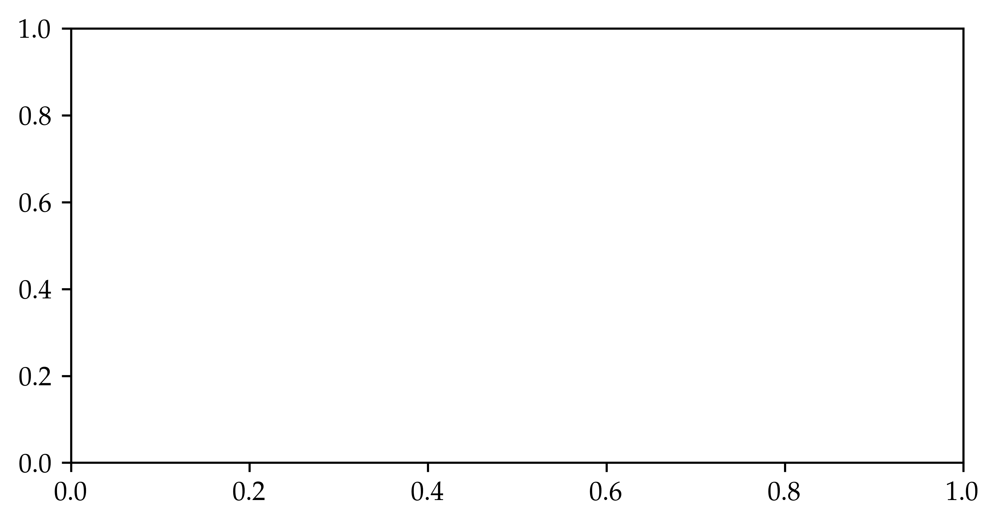

In [53]:
for src in datasets:
    
    if 'PKS 1424+240' not  in datasets[src]['common_name']: continue
    #if datasets[src]['common_name']!='Markarian 421': continue
    
    # Only target AGNs
    #if datasets[src]['classes'] not in ['fsrq','hbl','ibl','lbl','fri','snr','pwn','psr']:
    #    print('{0} is {1}'.format(datasets[src]['common_name'],datasets[src]['classes']))
    if datasets[src]['classes'] not in ['fsrq','hbl','ibl','lbl','fri']:
        continue
    
    ### extract the sed    
    if 'sed' not in datasets[src].keys():
        print('no sed')
        continue
    
    fig = plt.figure(figsize=(6,3))
    sedplot = fig.add_subplot(111)
    #sedplot = fig.add_axes((.1,.3,.8,.6))
    
    list_of_spectra = dict()
    list_of_spectra['xlog']    = []
    list_of_spectra['ylog']    = []
    list_of_spectra['yerrlog'] = []
    
    vhe_array   = get_vhe_points(datasets[src])
    
    ### Match with 3FHL
    matched = match_with_catalog(fhl3[1].data,datasets[src])
    if matched is not None:
        fermi = get_fermi_points(matched, '3FHL')
        for j in range(len(fermi['energy'].value)):
            list_of_spectra['xlog'].append(fermi['energy'][j].value)
            list_of_spectra['ylog'].append(fermi['eflux'][j].value)
            list_of_spectra['yerrlog'].append(fermi['efluxerr'][1][j].value)

        sedplot.errorbar(x=fermi['energy'].value,
                         xerr=fermi['energyerr'].value,
                         y=fermi['eflux'].value,
                         yerr=fermi['efluxerr'].value,
                         ls='',marker='o',color='black',ms=4,mfc='white',
                         label='{0} (3FHL)'.format(fermi['name']))
    else:
        print('no match in 3FHL')
    
    ### Match with 4FGL
    matched = match_with_catalog(fgl4[1].data,datasets[src])
    if matched is not None:
        fermi = get_fermi_points(matched,'4FGL')
        redshift = fermi['redshift']
        for j in range(len(fermi['energy'].value)):
            list_of_spectra['xlog'].append(fermi['energy'][j].value)
            list_of_spectra['ylog'].append(fermi['eflux'][j].value)
            list_of_spectra['yerrlog'].append(fermi['efluxerr'][1][j].value)
        
        sedplot.errorbar(x=fermi['energy'].value,
                         xerr=fermi['energyerr'].value,
                         y=fermi['eflux'].value,
                         yerr=fermi['efluxerr'].value,
                         ls='',marker='o',color='gray',ms=4,mfc='white',
                         label='{0} (3FHL)'.format(fermi['name']))
    else:
        print('no match in 4FGL')
    
    for k,vhe in enumerate(vhe_array):
        # plot every vhe spectrum
        for j in range(len(vhe['energy'].value)):
            list_of_spectra['xlog'].append(vhe['energy'][j].value)
            list_of_spectra['ylog'].append(vhe['eflux'][j].value)
            list_of_spectra['yerrlog'].append(vhe['efluxerr'][1][j].value)
        
        sedplot.errorbar(x=vhe['energy'].value,
                         xerr=vhe['energyerr'].value,
                         y=vhe['eflux'].value,
                         yerr=vhe['efluxerr'].value,
                         ls='',marker='D',ms=4,mfc='white',
                         label='{0}, {1} (VHE)'.format(vhe['name'],k+1))

    '''
    # ----- Fitting part ------
    # Get the data in log format as numpys
    xdata = np.log10(list_of_spectra['xlog'])
    ydata = np.log10(list_of_spectra['ylog'])
    ydataerr = np.log10(np.asarray(list_of_spectra['ylog'])+\
                        np.asarray(list_of_spectra['yerrlog']))-ydata
    
    # initial guess
    initial = [-10,1.5,0.2,0.2]
    #initial = [-10,1.8,1,1,0.1]
    
    # get the expected ebl absorption,
    # dont fit at too large taus
    ebl_atten = ebl_absorption(redshift,xdata)
    xdata = xdata[ebl_atten>1e-3]
    ydata = ydata[ebl_atten>1e-3]
    ydataerr = ydataerr[ebl_atten>1e-3]
    ebl_atten = ebl_atten[ebl_atten>1e-3]
    f = lambda *args: pwl_exp_supcutoff(*args)
    f = lambda *args: logparabola(*args)
    fabs = lambda *args: f(*args)*ebl_atten
    nll = lambda *args: -log_likelihood(fabs,*args)
    soln = sop.minimize(nll, initial, args=(xdata,ydata,ydataerr))
    
    xfit = np.linspace(-4,2,100)
    fitatten = ebl_absorption(redshift,xfit)
    xfit = 10**xfit[fitatten>1e-3]
    fitatten = fitatten[fitatten>1e-3]
    fabs = lambda *args: f(*args)*fitatten
    yfit = fabs(xfit,soln['x'][:-1])
    plt.plot(xfit,yfit,":k", label="ML")
    -----------------------------
    '''
    
    for model in [ "pwl", "lp", "plec" ]:
        #print(fermi[model])
        xfit = np.linspace(-4,2,100) # TeV
        fitatten = ebl_absorption(redshift,xfit)
        xfit = 10**xfit[fitatten>1e-3]
        fitatten = fitatten[fitatten>1e-3]
        #yfit = evaluate_fermi_sedmodel(xfit*1e6,fermi[model])*fitatten
        yfit = self.spectra.flexible_model(xfit*1e6,gammamodel[model])*fitatten
        plt.plot(xfit, yfit,label=model)
    
    # Try to generate a model for everything.
    #g_init = models.LogParabola1D(1,1,1,1)
    #fit_g = fitting.LevMarLSQFitter()
    #g = fit_g(g_init, list_of_spectra['xlog'], 
    #          list_of_spectra['ylog'])  
              #weights=1./np.asarray(list_of_spectra['yerrlog']))
    
    #xfit = 10**np.linspace(np.log10(40e-6),np.log10(100),100)
    #plt.plot(xfit, g(xfit))
    
    # Shrink current axis by 20%
    box = sedplot.get_position()
    sedplot.set_position([box.x0, box.y0, 
                          box.width * 0.8, box.height])
        
    sedplot.set_xlim(45*1e-6,100)
    sedplot.set_yscale('log')
    sedplot.set_xscale('log')
    sedplot.set_ylabel('$\mathrm{SED}\ [erg\ cm^{-2} s^{-1}]$')
    sedplot.set_xlabel('$\log_{10}(\mathrm{Energy})\ [TeV]$')
    sedplot.legend(fontsize='xx-small',
                   loc='center left', 
                   bbox_to_anchor=(1, 0.5))

    break
    #sedplot.set_ylim(np.log10(ymin*0.8),np.log10(ymax*1.1))
    #sedplot.yaxis.set_major_formatter(FuncFormatter(lambda x,y: '{}'.format(np.log10(x))))

In [1389]:
yfit

array([6.22410031e-12, 6.53642644e-12, 6.86442513e-12, 7.20888283e-12,
       7.57062547e-12, 7.95052039e-12, 8.34947849e-12, 8.76845636e-12,
       9.20845858e-12, 9.67054018e-12, 1.01558091e-11, 1.06654288e-11,
       1.12006214e-11, 1.17626700e-11, 1.23529222e-11, 1.29727934e-11,
       1.36237697e-11, 1.43074122e-11, 1.50253599e-11, 1.57793343e-11,
       1.65711433e-11, 1.74026853e-11, 1.82759542e-11, 1.91930439e-11,
       2.01561532e-11, 2.11675915e-11, 2.22297838e-11, 2.33452771e-11,
       2.45167460e-11, 2.57469994e-11, 2.70389870e-11, 2.83958067e-11,
       2.98207119e-11, 3.13171189e-11, 3.28886158e-11, 3.45389706e-11,
       3.62721404e-11, 3.80922809e-11, 4.00037563e-11, 4.20111498e-11,
       4.41192745e-11, 4.63331851e-11, 4.86581901e-11, 5.10998641e-11,
       5.36640617e-11, 5.63569309e-11, 5.91849287e-11, 6.21548358e-11,
       6.52737731e-11, 6.85492192e-11, 7.19890275e-11, 7.56014458e-11,
       7.93951358e-11, 8.33791935e-11, 8.75631718e-11, 9.19571026e-11,
      

In [ ]:
### add magic
A = pyfits.open("http://vobs.magic.pic.es/fits/mfits/base/MAGIC_2016_PKS1441.fits")